<a href="https://colab.research.google.com/github/lo-lim/Python_data-analyze/blob/main/BeautifulSoup.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

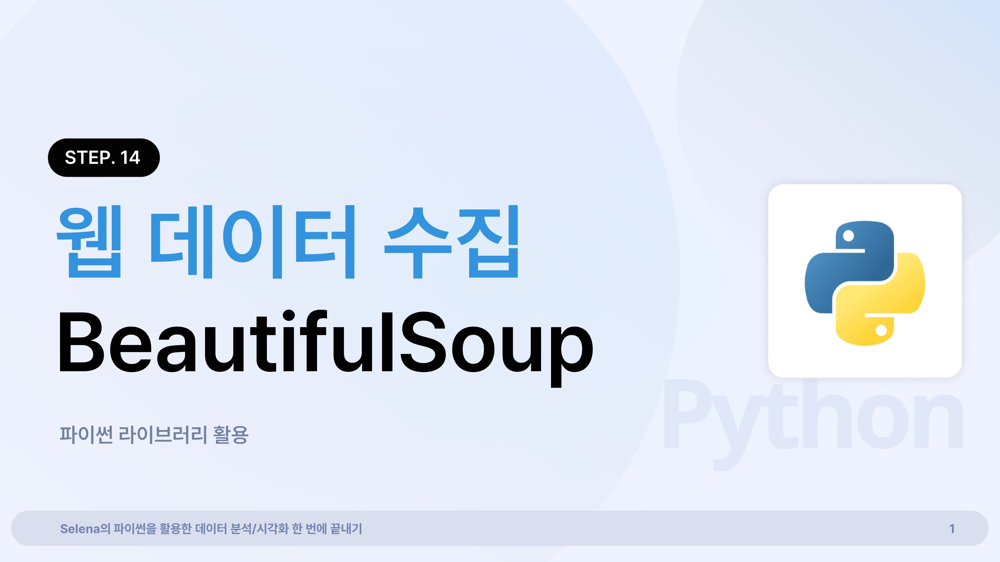

# **STEP 14. 웹 데이터 수집** 

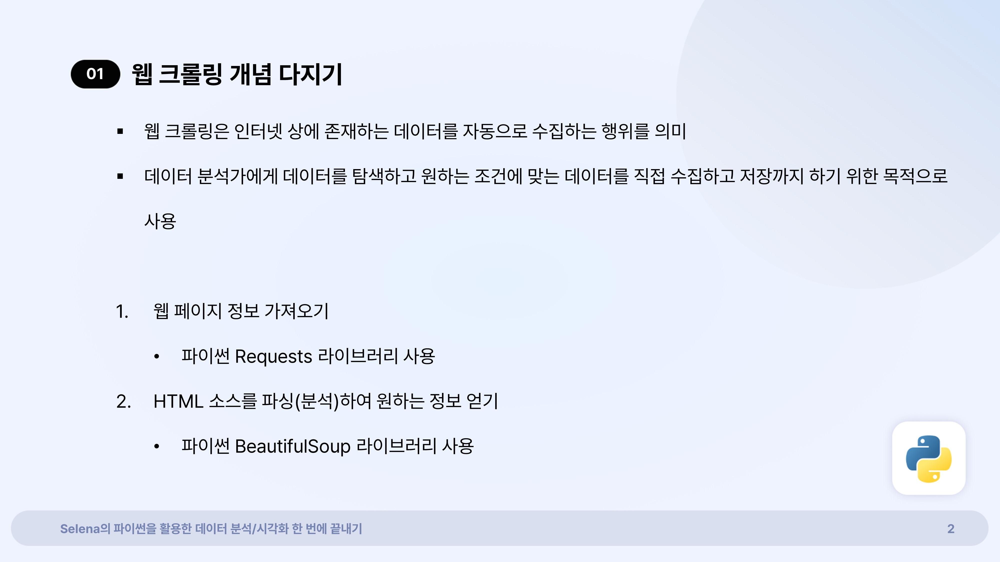

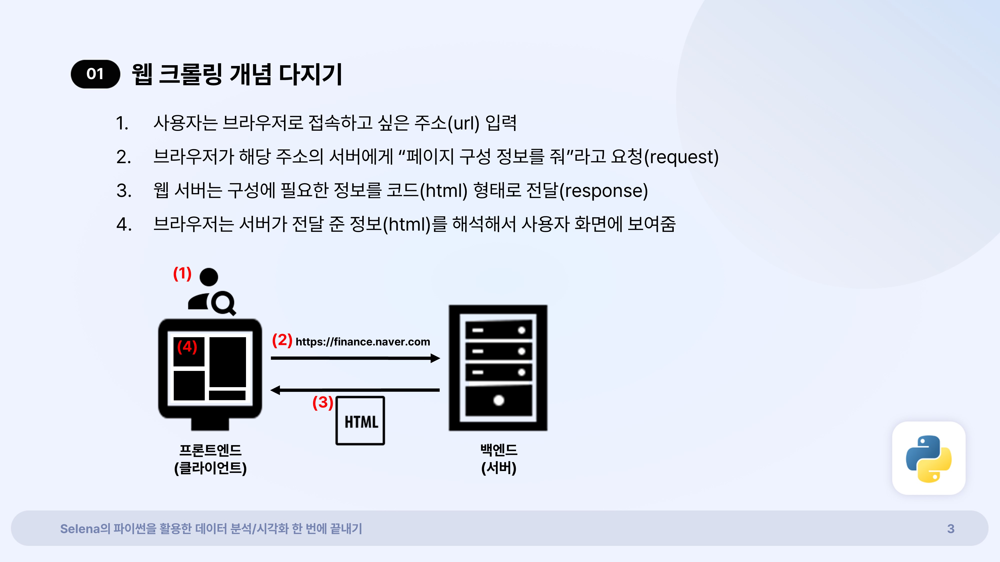

## **1. 웹 크롤링 개념 다지기**

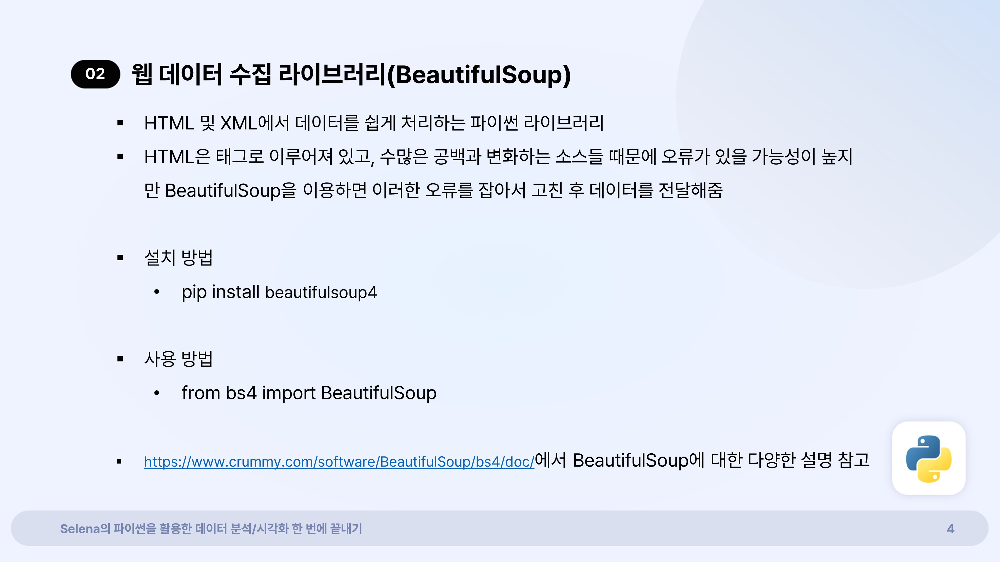

## **2. BeautifulSoup 기본 개념**

*   BeautifulSoup 패키지 추가
*   패키지가 없는 경우, 설치 명령어 : pip install beautifulsoup4

In [ ]:
# BeautifulSoup 불러오기
from bs4 import BeautifulSoup 

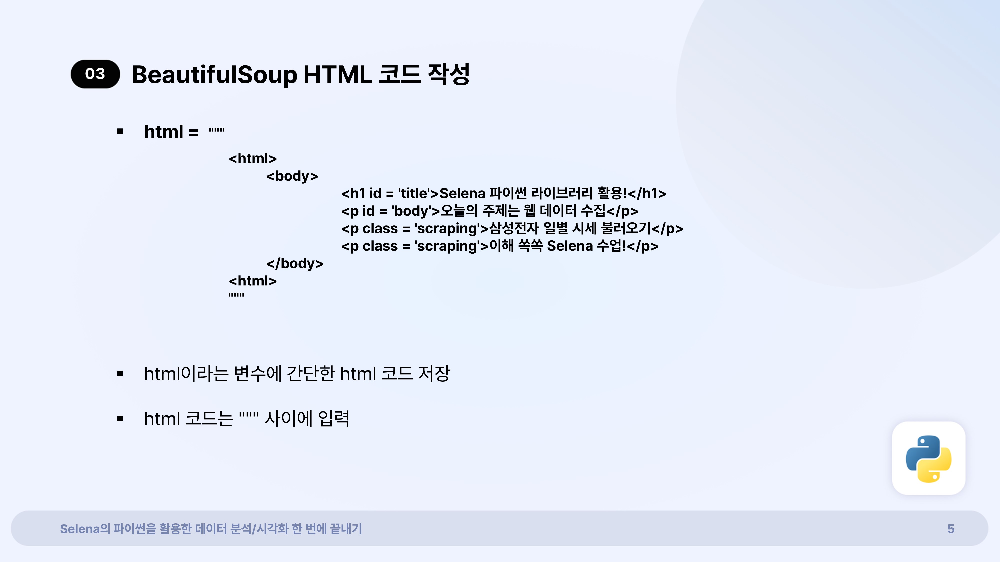

## **3. BeautifulSoup HTML 코드 작성**
- html이라는 변수에 간단한 html 코드 저장
- html 코드는 """ 사이에 입력 


In [ ]:
# HTML 코드 작성
html =  """ 
<html> 
	<body> 
	<h1 id = 'title'>Selena 파이썬 라이브러리 활용!</h1> 
	<p id = 'body'>오늘의 주제는 웹 데이터 수집</p> 
	<p class = 'scraping'>삼성전자 일별 시세 불러오기</p> 
	<p class = 'scraping'>이해 쏙쏙 Selena 수업!</p> 
	</body> 
<html> 
""" 

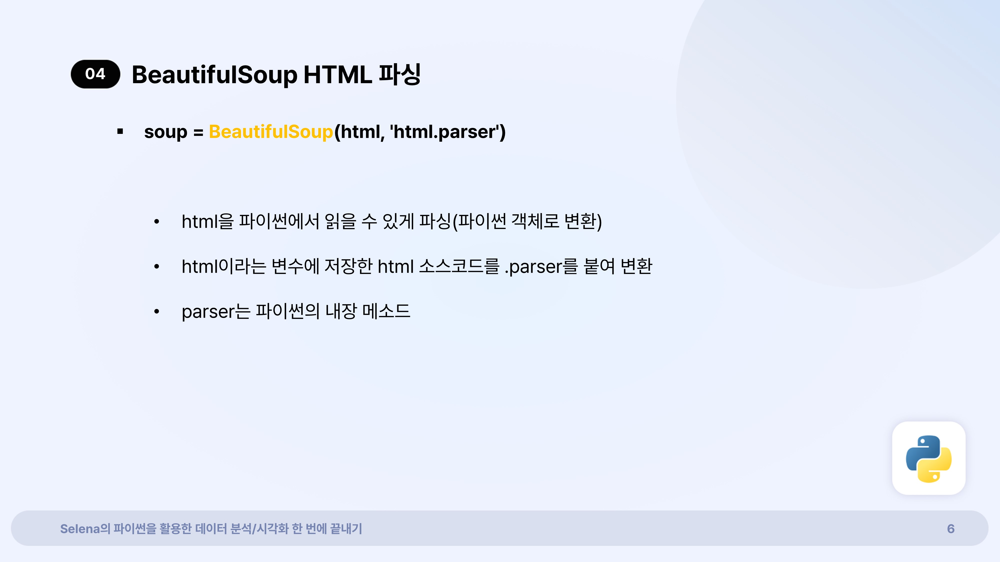

## **4. BeautifulSoup HTML 파싱**
- html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
- html이라는 변수에 저장한 html 소스코드를 .parser를 붙여 변환

In [ ]:
# BeautifulSoup 함수를 이용하여 soup 객체 생성
# html이라는 변수에 저장한 html 소스코드를 .parser를 붙여 변환
soup = BeautifulSoup(html, 'html.parser')

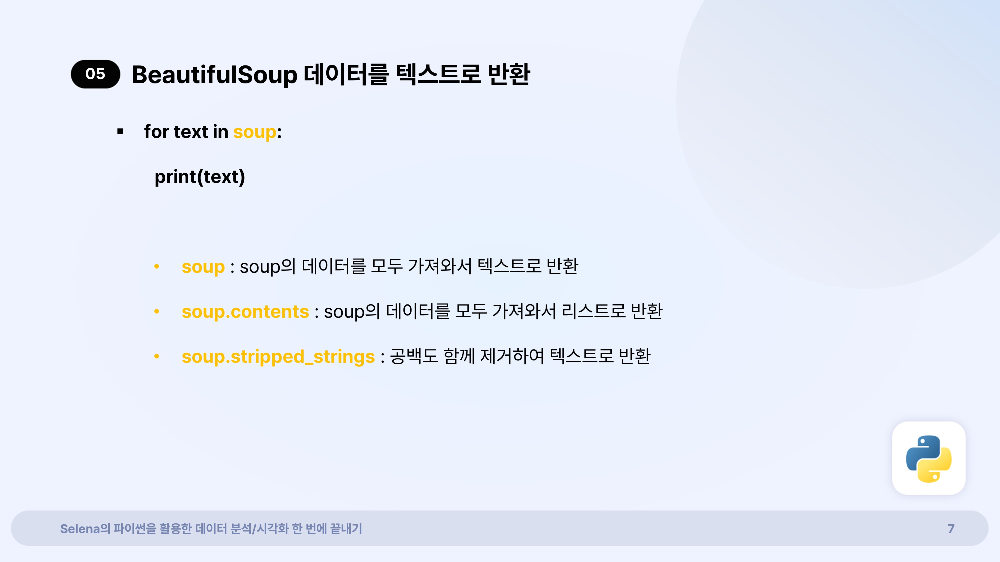

## **5. BeautifulSoup 데이터를 텍스트로 반환**

### **5-1. soup**
- soup : soup의 데이터를 모두 가져와서 텍스트로 반환
- soup.contents : soup의 데이터를 모두 가져와서 리스트로 반환

In [ ]:
# soup의 데이터를 모두 가져와서 텍스트로 반환
for text in soup: 
  print(text)



<html>
<body>
<h1 id="title">Selena 파이썬 라이브러리 활용!</h1>
<p id="body">오늘의 주제는 웹 데이터 수집</p>
<p class="scraping">삼성전자 일별 시세 불러오기</p>
<p class="scraping">이해 쏙쏙 Selena 수업!</p>
</body>
<html>
</html></html>


### **5-2. soup.stripped_strings**
- soup.stripped_strings : 공백도 함께 제거하여 텍스트로 반환

In [ ]:
# soup의 데이터를 모두 가져와서 
# 공백도 함께 제거하여 텍스트로 반환
for stripped_text in soup.stripped_strings: 
  print(stripped_text)

Selena 파이썬 라이브러리 활용!
오늘의 주제는 웹 데이터 수집
삼성전자 일별 시세 불러오기
이해 쏙쏙 Selena 수업!


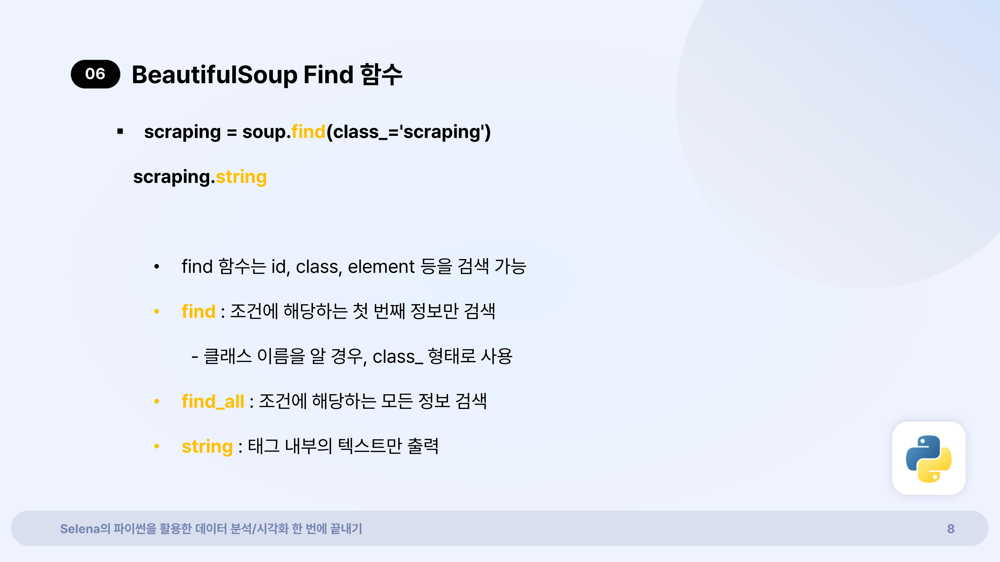

## **6. BeautifulSoup Find 함수**

 ### **6-1. find()**
- find 함수는 id, class, element 등을 검색 가능
- find : 조건에 해당하는 첫 번째 정보만 검색
> - 클래스 이름을 알 경우, class_ 형태로 사용

In [ ]:
# id 값이 'title'인 조건에 해당하는 첫 번째 정보만 검색
title = soup.find(id='title')
print(title)

<h1 id="title">Selena 파이썬 라이브러리 활용!</h1>


In [ ]:
# class 값이 'scraping'인 조건에 해당하는 첫 번째 정보만 검색
# 클래스 이름을 알 경우, class_ 형태로 사용
scraping = soup.find(class_='scraping')
print(scraping)

<p class="scraping">삼성전자 일별 시세 불러오기</p>


### **6-2. find_all()**
 - find_all : 조건에 해당하는 모든 정보 검색

In [ ]:
# class 값이 'scraping'인 조건에 해당하는 모든 정보 검색
scraping_all = soup.find_all(class_='scraping')
print(scraping_all)

[<p class="scraping">삼성전자 일별 시세 불러오기</p>, <p class="scraping">이해 쏙쏙 Selena 수업!</p>]


### **6-3. string**
- string : 태그 내부의 텍스트만 출력



In [ ]:
# 태그 내부의 텍스트만 출력 
scraping.string

'삼성전자 일별 시세 불러오기'

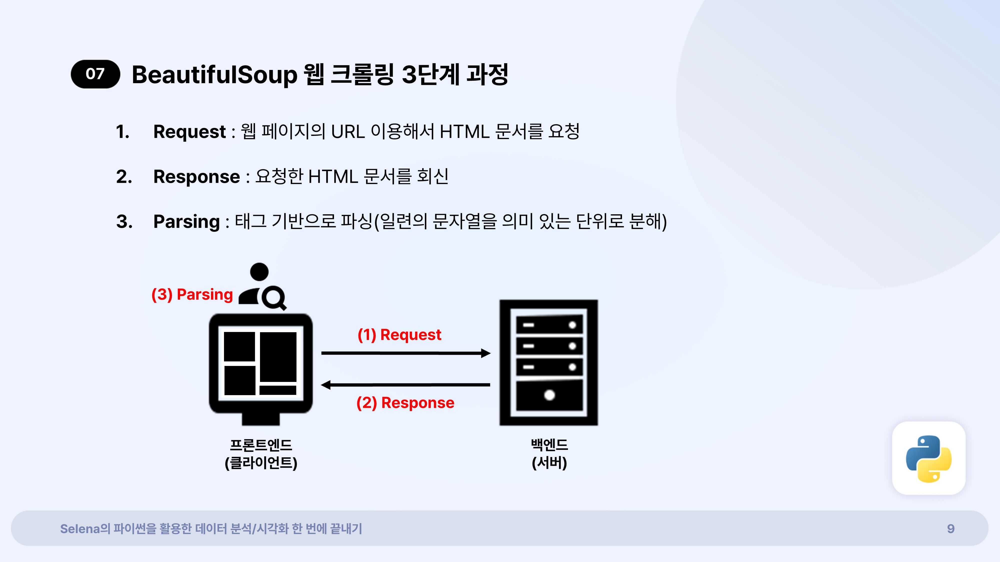

## **7. BeautifulSoup 웹 크롤링 3단계 과정**
- Request : 웹 페이지의 URL 이용해서 HTML 문서를 요청
> - 첫 번째 단계인 Request를 위해 import urllib.request 불러오기
- Response : 요청한 HTML 문서를 회신
- Parsing : 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)


In [ ]:
# 웹 페이지의 URL을 이용해서 HTML 문서를 요청하기 위해 필요한 라이브러리
import requests 

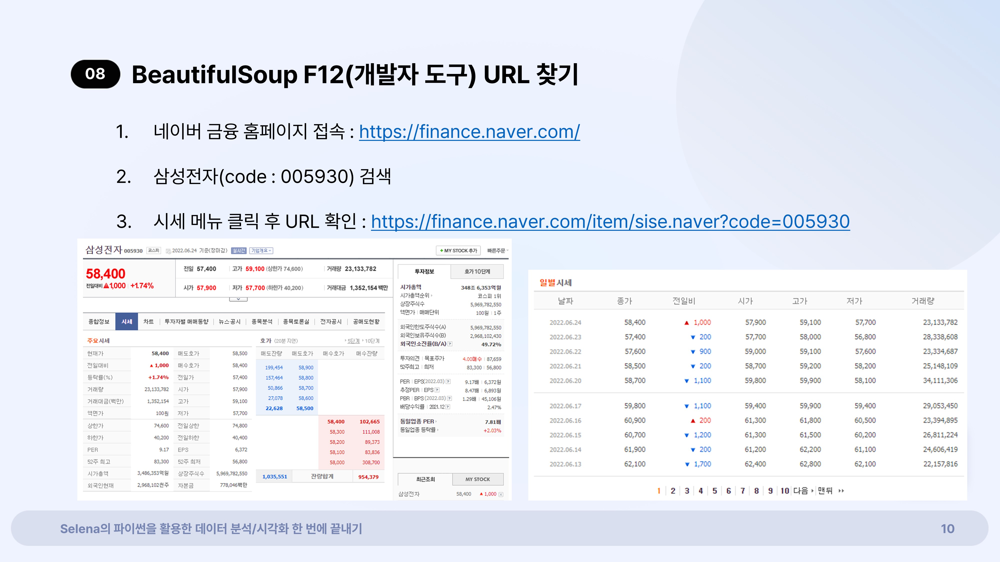

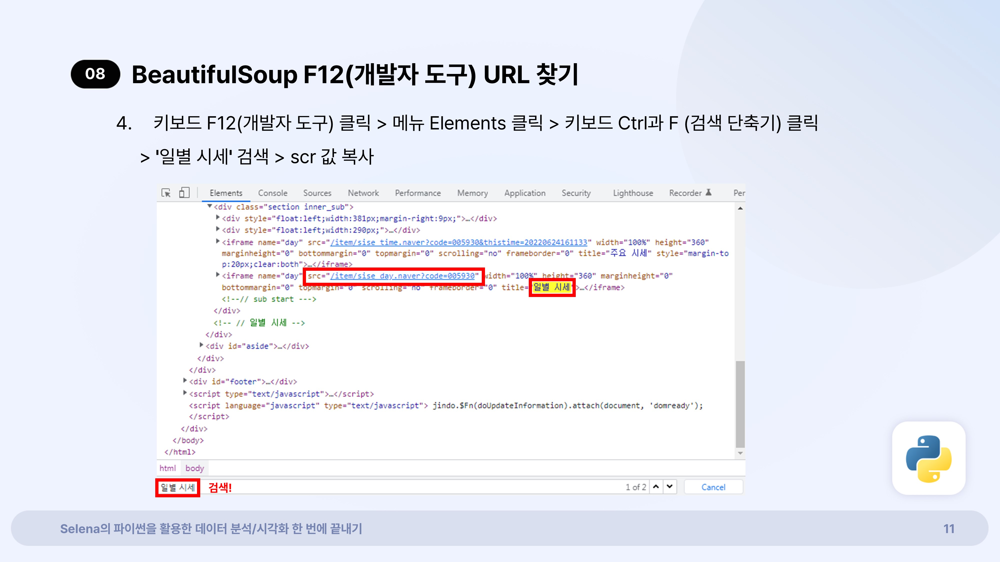

## **8. BeautifulSoup F12(개발자 도구) URL 찾기**
- 1) 네이버 금융 홈페이지 접속 : https://finance.naver.com/
- 2) 삼성전자(code : 005930) 검색 
- 3) 시세 메뉴 클릭 후 URL 확인 : https://finance.naver.com/item/sise.naver?code=005930
- 4) 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '일별 시세' 검색 > scr 값 복사  


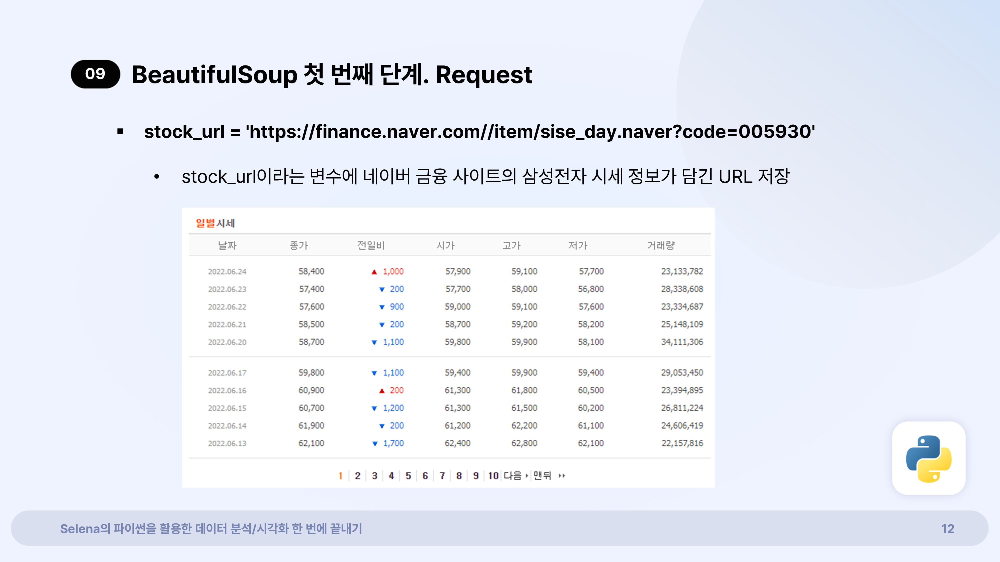

## **9. BeautifulSoup 첫 번째 단계. Request**

### **9-1. URL 저장**
- stock_url이라는 변수에 네이버 금융 사이트의 삼성전자 시세 정보가 담긴 URL 저장

In [ ]:
# stock_url이라는 변수에 URL 저장
stock_url = 'https://finance.naver.com//item/sise_day.naver?code=005930'

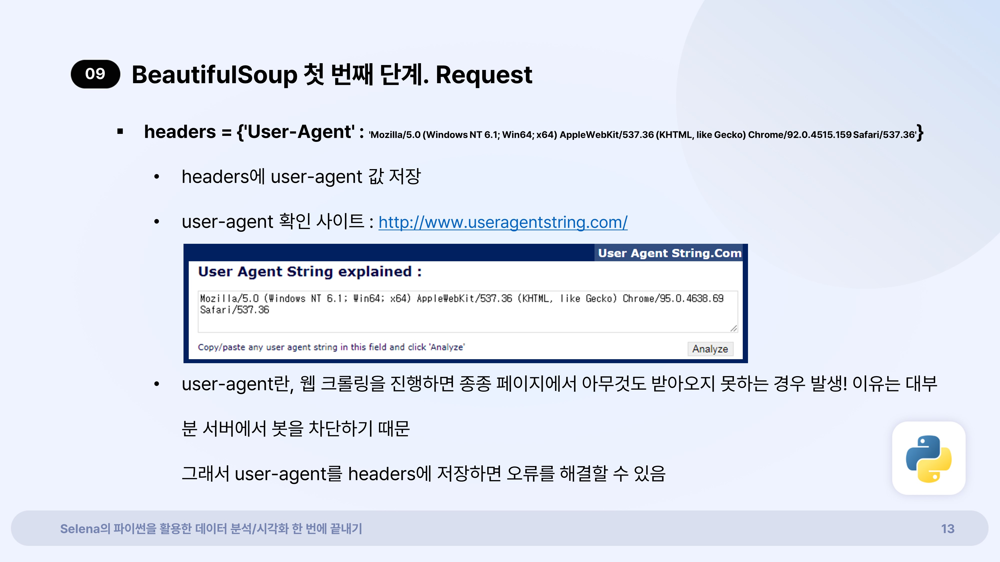

### **9-2. User-agent 설정**
- user-agent 확인 사이트 : http://www.useragentstring.com/
- user-agent란, 웹 크롤링을 진행하면 종종 페이지에서 아무것도 받아오지 못하는 경우 발생! 이유는 대부분 서버에서 봇을 차단하기 때문 
- 그래서 user-agent를 headers에 저장하면 오류를 해결할 수 있음


In [ ]:
# header에 user-agent 값 저장
headers = {'User-Agent':'Mozilla/5.0 (Windows NT 10.0; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/108.0.0.0 Safari/537.36'}  

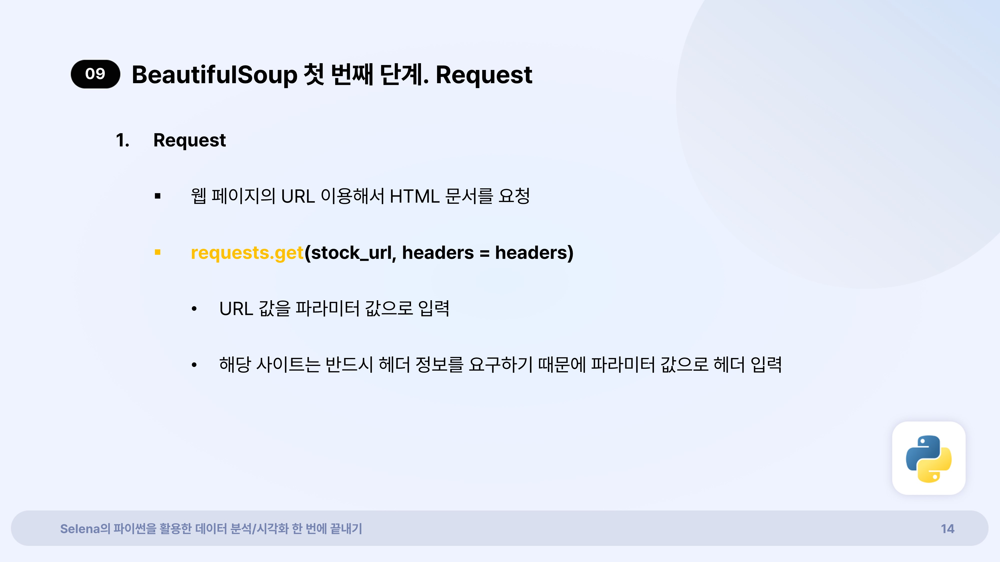

### **9-3. requests.get()**
- 웹 페이지의 URL 이용해서 HTML 문서를 요청
- requests.get(stock_url, headers = headers)
> - URL 값을 파라미터 값으로 입력
> - 해당 사이트는 반드시 헤더 정보를 요구하기 때문에 파라미터 값으로 헤더 입력

In [ ]:
# request.get 함수를 통해 URL를 이용하여 HTML 문서를 요청
requests.get(stock_url, headers = headers)

<Response [200]>

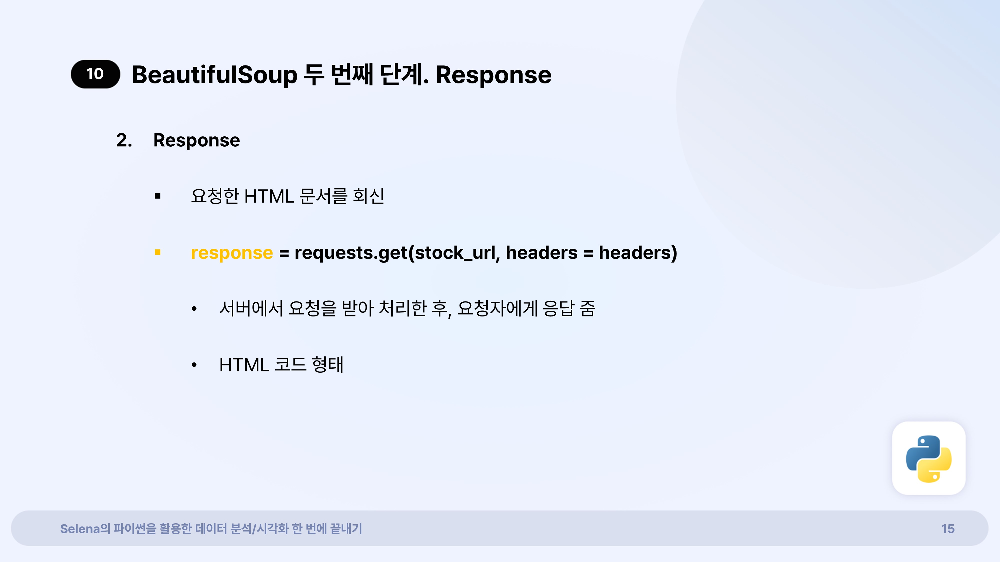

## **10. BeautifulSoup 두 번째 단계. Response**
- 요청한 HTML 문서를 회신
- response = requests.get(stock_url, headers = headers)
> - 서버에서 요청을 받아 처리한 후, 요청자에게 응답 줌
> - HTML 코드 형태

In [ ]:
# response 변수에 요청한 HTML 문서를 회신하여 저장
response = requests.get(stock_url, headers = headers)

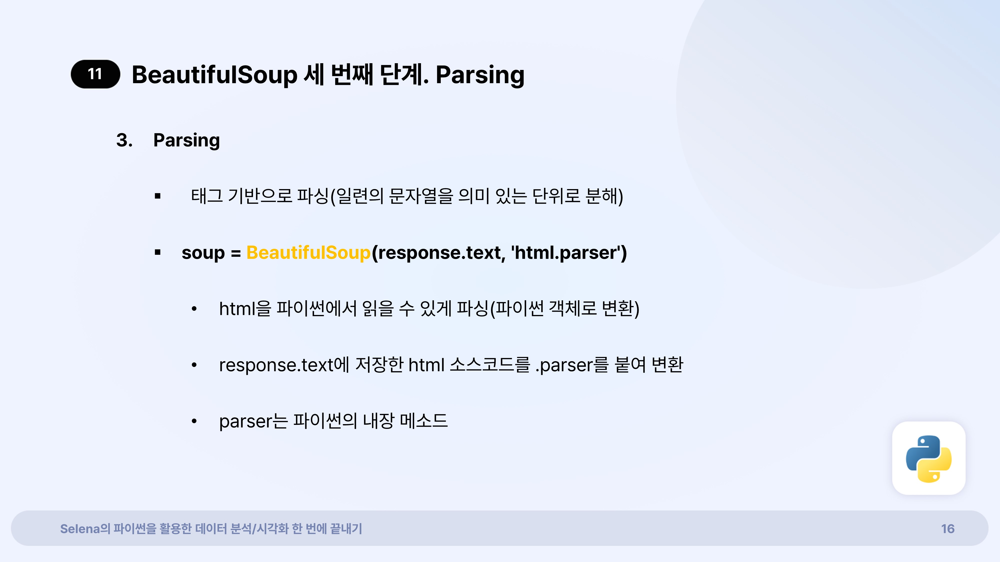

## **11. BeautifulSoup 세 번째 단계. Parsing**
- 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)
- soup = BeautifulSoup(response.text, 'html.parser')
> - html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
> - Response.text에 저장한 html 소스코드를 .parser를 붙여 변환
> - parser는 파이썬의 내장 메소드


In [ ]:
# soup 변수에 BeautifulSoup의 객체 생성
# HTML 코드를 파이썬에서 읽을 수 있도록 파싱
soup = BeautifulSoup(response.text, 'html.parser')

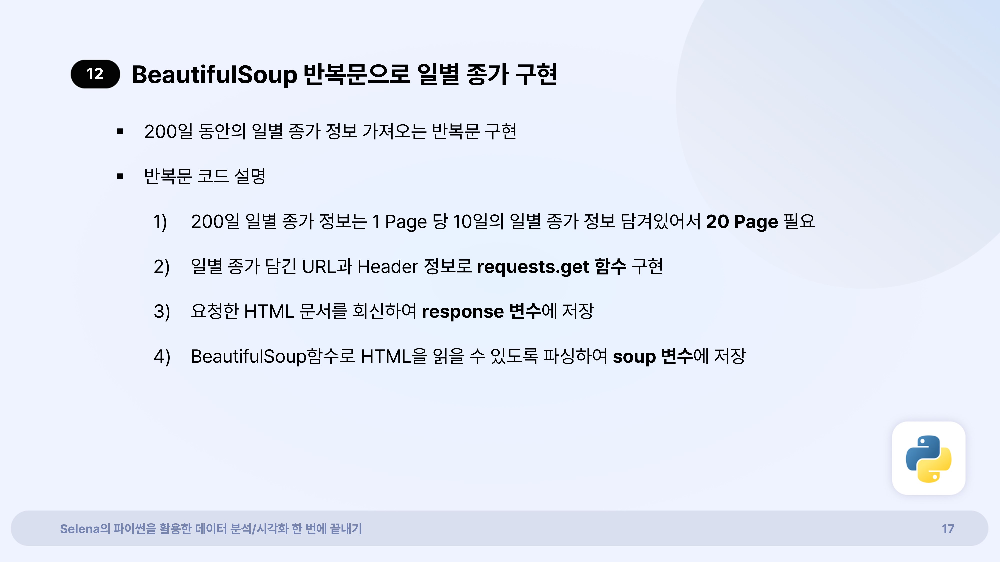

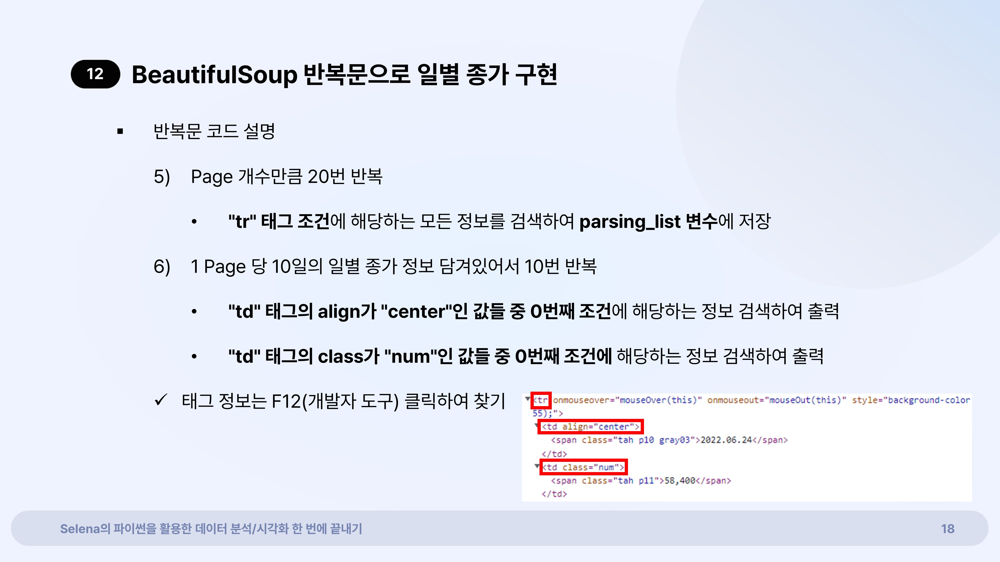

## **12. BeautifulSoup 반복문으로 일별 종가 구현**
- 1) 200일 일별 종가 정보는 1 Page 당 10일의 일별 종가 정보 담겨있어서 20 Page 필요
- 2) 일별 종가 담긴 URL과 Header 정보로 requests.get 함수 구현
- 3) 요청한 HTML 문서를 회신하여 response 변수에 저장
- 4) BeautifulSoup함수로 HTML을 읽을 수 있도록 파싱하여 soup 변수에 저장 
- 5) Page 개수만큼 20번 반복 
> - "tr" 태그 조건에 해당하는 모든 정보를 검색하여 parsing_list 변수에 저장 
- 6) 1 Page 당 10일의 일별 종가 정보 담겨있어서 10번 반복
> - "td" 태그의 align가 "center"인 값들 중 0번째 조건에 해당하는 정보 검색하여 출력
> - "td" 태그의 class가 "num"인 값들 중 0번째 조건에 해당하는 정보 검색하여 출력

**태그 정보는 F12(개발자 도구) 클릭하여 찾기**

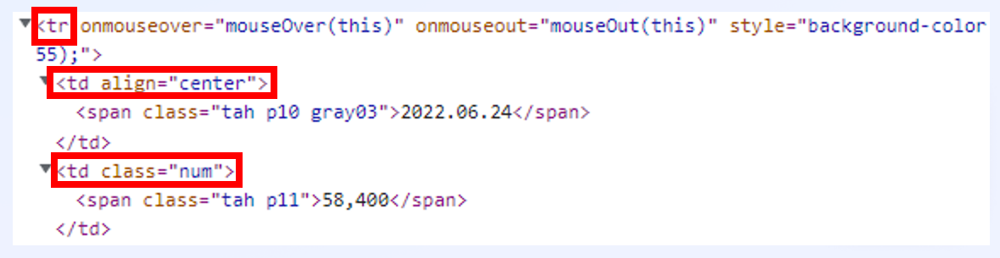

In [ ]:
# 200일 동안의 일별 종가 정보 가져오는 반복문(1페이지 당 10일 정보 담겨있음)
for page in range(1, 21):
  print (str(page))
  
  # url + page 번호 합치기
  stock_url = 'http://finance.naver.com/item/sise_day.nhn?code=005930' +'&page='+ str(page)
  
  # header 정보
  headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}  

  # request : 웹 페이지의 URL, header 이용해서 HTML 문서 요청
  # response : 요청한 HTML 문서 회신
  response = requests.get(stock_url, headers = headers)

  # parsing : HTML을 읽을 수 있도록 파싱
  # soup 변수에 BeautifulSoup의 객체 생성 
  soup = BeautifulSoup(response.text, 'html.parser')

  # "tr" 태그 조건에 해당하는 모든 정보 검색
  parsing_list = soup.find_all("tr")

  # None 값은 걸러주기 위한 변수 생성
  isCheckNone = None 

  # 페이지당 일별 종가 출력하기 위한 반복문 <들여쓰기 주의>
  for i in range(1, len(parsing_list)):
    # None 값은 걸러주기 위한 조건문 <들여쓰기 주의> 
    # .span()는 매치된 문자열의 (시작, 끝)에 해당하는 튜플을 돌려주는 함수  
    if(parsing_list[i].span != isCheckNone):
      # parsing_list[i] : i번째 parsing_list, i 번째 "tr" 태그 값
      # .find_all("td", align="center")[0].text : "td" 태그의 align가 "center"인 값들 중 0번째 값
      # .find_all("td", class_="num")[0].text : "td" 태그의 class가 "num"인 값들 중 0번째 값 
      print(parsing_list[i].find_all("td", align="center")[0].text,
            parsing_list[i].find_all("td", class_="num")[0].text) 

1
2022.12.27 58,200
2022.12.26 57,900
2022.12.23 58,100
2022.12.22 59,100
2022.12.21 58,000
2022.12.20 58,600
2022.12.19 59,500
2022.12.16 59,500
2022.12.15 59,300
2022.12.14 60,500
2
2022.12.13 59,700
2022.12.12 59,500
2022.12.09 60,400
2022.12.08 59,200
2022.12.07 58,900
2022.12.06 59,200
2022.12.05 60,300
2022.12.02 60,400
2022.12.01 62,600
2022.11.30 62,200
3
2022.11.29 60,600
2022.11.28 60,100
2022.11.25 61,000
2022.11.24 61,400
2022.11.23 61,000
2022.11.22 60,600
2022.11.21 61,400
2022.11.18 61,800
2022.11.17 61,400
2022.11.16 62,700
4
2022.11.15 62,400
2022.11.14 61,900
2022.11.11 62,900
2022.11.10 60,400
2022.11.09 62,000
2022.11.08 61,800
2022.11.07 60,200
2022.11.04 59,400
2022.11.03 59,200
2022.11.02 59,600
5
2022.11.01 60,000
2022.10.31 59,400
2022.10.28 57,300
2022.10.27 59,500
2022.10.26 59,400
2022.10.25 57,700
2022.10.24 57,500
2022.10.21 55,900
2022.10.20 55,500
2022.10.19 55,800
6
2022.10.18 56,500
2022.10.17 56,600
2022.10.14 56,300
2022.10.13 55,200
2022.10.12 55,80

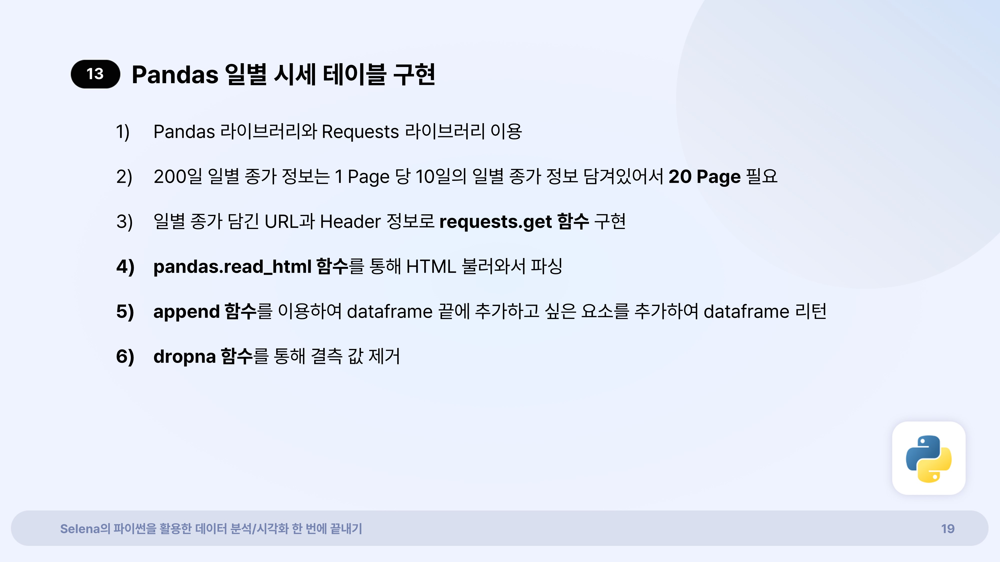

## **13. Pandas 일별 시세 테이블 구현**
- 1) Pandas 라이브러리와 Requests 라이브러리 이용
- 2) 200일 일별 종가 정보는 1 Page 당 10일의 일별 종가 정보 담겨있어서 20 Page 필요
- 3) 일별 종가 담긴 URL과 Header 정보로 requests.get 함수 구현
- 4) pandas.read_html 함수를 통해 HTML 불러와서 파싱
- 5) append 함수를 이용하여 dataframe 끝에 추가하고 싶은 요소를 추가하여 dataframe 리턴
- 6) dropna 함수를 통해 결측 값 제거


In [ ]:
# 네이버 금융 일별 시세 테이블 불러오기
# pandas 라이브러리와 requests 라이브러리 이용
# code = 회사 코드, page = 일별 시세 테이블의 페이지 수 (200 행의 데이터 불러오려면 20 페이지 입력)
import pandas as pd

df = pd.DataFrame()

for page in range(1,21):
    stock_url = 'http://finance.naver.com/item/sise_day.nhn?code=005930' +'&page='+ str(page)  

    # header 정보
    headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}  

    # request : 웹 페이지의 URL, header 이용해서 HTML 문서 요청
    # response : 요청한 HTML 문서 회신
    response = requests.get(stock_url, headers = headers)

    # response.text로 응답을 주면 HTML 코드이기 때문에 read_html로 불러오기
    # append() : dataframe 끝에 추가하고 싶은 요소를 추가하여 새로운 dataframe을 리턴
    df = df.append(pd.read_html(response.text, header=0)[0], ignore_index=True) 

# 결측 값 있는 행 제거
df = df.dropna()
df

,날짜,종가,전일비,시가,고가,저가,거래량
1,2021.12.21,78100.0,1000.0,77900.0,78300.0,77500.0,13333496.0
2,2021.12.20,77100.0,900.0,77600.0,77800.0,76800.0,11264375.0
3,2021.12.17,78000.0,200.0,76800.0,78000.0,76800.0,13108479.0
4,2021.12.16,77800.0,200.0,78500.0,78500.0,77400.0,11996128.0
5,2021.12.15,77600.0,600.0,76400.0,77600.0,76300.0,9584939.0
...,...,...,...,...,...,...,...
294,2021.03.11,82000.0,1100.0,81000.0,82500.0,81000.0,23818297.0
295,2021.03.10,80900.0,500.0,82400.0,82500.0,80700.0,20038422.0
296,2021.03.09,81400.0,600.0,81400.0,81900.0,80600.0,25420764.0
297,2021.03.08,82000.0,100.0,82900.0,83000.0,81600.0,17641256.0


# **자기 주도 학습 복습 과제 - 정답지**
* 실습자료에 있는 문제를 풀고 아래의 답을 맞혀주세요. :)

## **1. BeautifulSoup 문제 (1)**

* BeautifulSoup 선언



In [ ]:
# 1) BeautifulSoup 불러오기
from bs4 import BeautifulSoup 

## **2. BeautifulSoup 문제 (2)**

* BeautifulSoup SK하이닉스 시간별 시세 테이블 가져오기
- [1] 네이버 금융 홈페이지 접속 : https://finance.naver.com/
- [2] SK하이닉스(code : 000660) 검색 
- [3)] 시세 메뉴 클릭 후 URL 확인 : https://finance.naver.com/item/sise.naver?code=000660
- [4] 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '시간별' 검색 > scr 값 복사 : /item/sise_time.naver?code=000660&thistime=20220929130246  
- [1]과 [4] 링크 합쳐서 URL로 저장



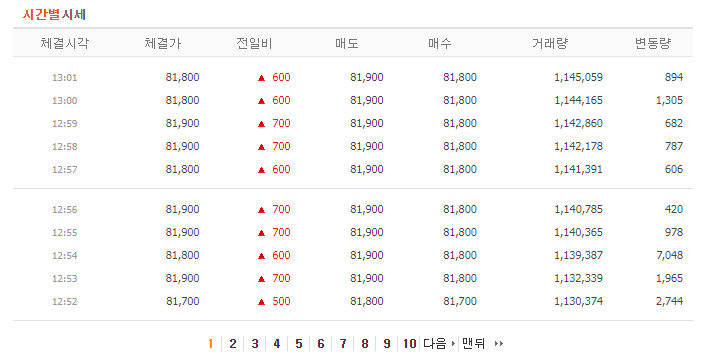

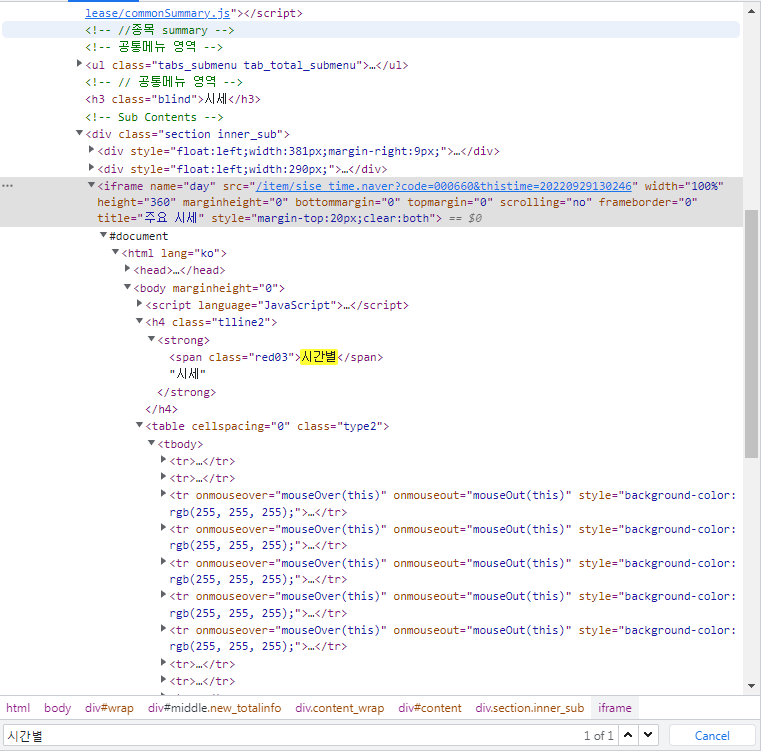

In [ ]:
# 1) stock_url이라는 변수에 Sk하이닉스 시간별 시세의 scr를 URL 저장
# [1] 네이버 금융 홈페이지 접속 : https://finance.naver.com/
# [4] 키보드 F12(개발자 도구) 클릭 > 메뉴 Elements 클릭 > 키보드 Ctrl과 F (검색 단축기) 클릭 > '시간별' 검색 > scr 값 복사 : /item/sise_time.naver?code=000660&thistime=20220929130246  
# [1]과 [4] 링크 합쳐서 URL로 저장
stock_url = "https://finance.naver.com//item/sise_time.naver?code=000660&thistime=20220929130246"

## **3. BeautifulSoup 문제 (3)**

* BeautifulSoup User-agent 설정
- user-agent 확인 사이트 : http://www.useragentstring.com/



In [ ]:
# 1) header에 user-agent 값 저장
# user-agent란, 웹 크롤링을 진행하면 종종 페이지에서 아무것도 받아오지 못하는 경우 발생! 이유는 대부분 서버에서 봇을 차단하기 때문 
# 그래서 user-agent를 headers에 저장하면 오류를 해결할 수 있음
headers = {'User-Agent':'Mozilla/5.0 (Windows NT 6.1; Win64; x64) AppleWebKit/537.36 (KHTML, like Gecko) Chrome/92.0.4515.159 Safari/537.36'}  

## **4. BeautifulSoup 문제 (4)**

* BeautifulSoup 첫 번째 단계. Request

In [ ]:
# 1) requests 불러오기
# 웹 페이지의 URL을 이용해서 HTML 문서를 요청하기 위해 필요한 라이브러리
import requests 

In [ ]:
# 2) stock_url, headers 정보를 이용하여 HTML 문서를 요청
# requests.get(stock_url, headers = headers)
# - URL 값을 파라미터 값으로 입력
# - 해당 사이트는 반드시 헤더 정보를 요구하기 때문에 파라미터 값으로 헤더 입력
requests.get(stock_url, headers = headers)

<Response [200]>

## **5. BeautifulSoup 문제 (5)**

* BeautifulSoup 두 번째 단계. Response

In [ ]:
# 1) 요청한 HTML 문서를 회신하여 response 변수에 저장
# response = requests.get(stock_url, headers = headers)
# - 서버에서 요청을 받아 처리한 후, 요청자에게 응답 줌
# - HTML 코드 형태
response = requests.get(stock_url, headers = headers)

## **6. BeautifulSoup 문제 (6)**

* BeautifulSoup 세 번째 단계. Parsing

In [ ]:
# 1) soup 변수에 BeautifulSoup의 객체 생성하고 HTML 코드를 파이썬에서 읽을 수 있도록 파싱
# 태그 기반으로 파싱(일련의 문자열을 의미 있는 단위로 분해)
# soup = BeautifulSoup(response.text, 'html.parser')
# - html을 파이썬에서 읽을 수 있게 파싱(파이썬 객체로 변환)
# - Response.text에 저장한 html 소스코드를 .parser를 붙여 변환
# - parser는 파이썬의 내장 메소드
soup = BeautifulSoup(response.text, 'html.parser')

## **7. BeautifulSoup 문제 (7)**

* BeautifulSoup 데이터를 텍스트로 반환

In [ ]:
# 1) soup 변수에서 'tr' 태그 조건에 해당하는 모든 정보를 검색하여 parsing_list변수에 저장  
# find_all : 특정 조건에 해당하는 모든 정보 검색
parsing_list = soup.find_all("tr")

## **8. BeautifulSoup 문제 (8)**

* BeautifulSoup 데이터 출력을 위한 for문

In [ ]:
# 1) 수업 복습으로 for문 한 줄씩 읽으면서 이해하기

# None 값은 걸러주기 위한 변수 생성
isCheckNone = None

# 페이지당 일별 종가 출력하기 위한 반복문 <들여쓰기 주의>
for i in range(1, len(parsing_list)):
  # None 값은 걸러주기 위한 조건문 <들여쓰기 주의> 
  # .span()는 매치된 문자열의 (시작, 끝)에 해당하는 튜플을 돌려주는 함수  
  if(parsing_list[i].span != isCheckNone):
    # parsing_list[i] : i번째 parsing_list, i 번째 "tr" 태그 값
    # .find_all("td", align="center")[0].text : "td" 태그의 align가 "center"인 값들 중 0번째 값
    # .find_all("td", class_="num")[0].text : "td" 태그의 class가 "num"인 값들 중 0번째 값 
    print(parsing_list[i].find_all("td", align="center")[0].text,
          parsing_list[i].find_all("td", class_="num")[0].text) 

13:02 81,600
13:01 81,800
13:00 81,800
12:59 81,900
12:58 81,900
12:57 81,800
12:56 81,900
12:55 81,900
12:54 81,800
12:53 81,900
